# 01- Download RAW ATL06 Data via icepyx package and read into xarray dataset

### Workflow: 
* Use icepyx to download hdf5 files of regions of interest
* Extract the data groups of interest from all hdf5 files 
* Combine all these data groups of multiple files into one single xarray dataset to faciliate subsequent data processing & visualization
* Convert data into netcdf and zarr
* Use intake catalog to read netcdf and zarr
* Use intake catalog to streamline parameters reading directly from hdf5 files 

#### Here we take Foundation Ice Stream of Filchner-Ronne Ice Shelf for example

References: 

- http://gallery.pangeo.io/repos/pangeo-gallery/physical-oceanography/02_along_track.html
- http://gallery.pangeo.io/repos/pangeo-data/pangeo-tutorial-gallery/intake.html

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
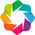

In [1]:
import icepyx as ipx
import os
import fnmatch
import shutil
import h5py
import xarray as xr
import h5netcdf
import intake
import pandas as pd
from tqdm import tqdm
from intake import open_catalog
import cartopy.crs as ccrs
from convert import file_list, icesat2_hdf5_to_xarray
%matplotlib inline

import matplotlib.pyplot as plt
import hvplot.intake
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

### Define query parameters for icepyx NSIDC data request
**Reference:**
- https://github.com/icesat2py/icepyx/blob/master/examples/ICESat-2_DAAC_DataAccess_Example.ipynb
- https://github.com/icesat2py/icepyx/blob/master/examples/ICESat-2_DAAC_DataAccess2_Subsetting.ipynb

In [2]:
#bounding box
short_name = 'ATL06'
# Given in decimal degrees for the lower left longitude, lower left latitude, upper right longitude, and upper right latitude
spatial_extent = [-61.7189, -83.5349, -60.7723, -83.3023]
date_range = ['2020-09-30','2020-11-28']
region_a = ipx.Query(short_name, spatial_extent, date_range)

In [3]:
print(region_a.dataset)
print(region_a.dates)
print(region_a.start_time)
print(region_a.end_time)
print(region_a.dataset_version)
print(region_a.cycles)
print(region_a.tracks)
# region_a.visualize_spatial_extent()

ATL06
['2020-09-30', '2020-11-28']
00:00:00
23:59:59
003
['09']
['0095', '0156', '0217', '0223', '0345', '0406', '0415', '0467', '0476', '0528', '0537', '0598', '0659', '0720', '0726']


### Download ATL06 data

In [ ]:
earthdata_uid = 'yourearthdataid'
email = 'youremailaddress'
region_a.earthdata_login(earthdata_uid, email)

In [ ]:
region_a.order_granules()

In [ ]:
#view a short list of order IDs
region_a.granules.orderIDs

In [4]:
path = '/Users/lt/Desktop/Intake_TEST/ATL06_RAW'

In [ ]:
region_a.download_granules(path)

### Check downloaded .h5 files

In [5]:
downloaded_atl06_list = file_list(path)
downloaded_atl06_list

['/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200504173733_05980711_003_02.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200930102922_00950911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201020191331_04060911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201029090529_05370911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201106084847_06590911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201024190509_04670911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200426034538_04670711_003_02.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201004102101_01560911_003_01.h5',
 '/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201102085708_05980911_003_01.h5']

### Get metadata from datafiles including rgt, cycle

In [13]:
rgtlist, cyclelist = [], []

for fname in downloaded_atl06_list:
    
    data_format = intake.source.utils.reverse_format(
    format_string="processed_{product:5d}_{datetime:%Y%m%d%H%M%S}_{rgt:04}{cycle:02d}{region:02d}_{release:03d}_{version:02d}.h5",
    resolved_string=fname)

    rgtlist.append(data_format['rgt'])
    cyclelist.append(data_format['cycle'])
    
list(zip(downloaded_atl06_list,rgtlist,cyclelist))

[('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200504173733_05980711_003_02.h5',
  '0598',
  7),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200930102922_00950911_003_01.h5',
  '0095',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201020191331_04060911_003_01.h5',
  '0406',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201029090529_05370911_003_01.h5',
  '0537',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201106084847_06590911_003_01.h5',
  '0659',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201024190509_04670911_003_01.h5',
  '0467',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20200426034538_04670711_003_02.h5',
  '0467',
  7),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201004102101_01560911_003_01.h5',
  '0156',
  9),
 ('/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_20201102085708_05980911_003_01.h5',
  '0598',
  9)]

In [14]:
# check hdf5 keys
h5file = h5py.File(downloaded_atl06_list[1], 'r')
h5file.keys()

<KeysViewHDF5 ['METADATA', 'ancillary_data', 'gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r', 'orbit_info', 'quality_assessment']>

In [15]:
ds = h5file['/gt1l/land_ice_segments/geophysical']
print(ds)
list(ds.items())

<HDF5 group "/gt1l/land_ice_segments/geophysical" (19 members)>


[('bckgrd', <HDF5 dataset "bckgrd": shape (1371,), type "<f4">),
 ('bsnow_conf', <HDF5 dataset "bsnow_conf": shape (1371,), type "|i1">),
 ('bsnow_h', <HDF5 dataset "bsnow_h": shape (1371,), type "<f4">),
 ('bsnow_od', <HDF5 dataset "bsnow_od": shape (1371,), type "<f4">),
 ('cloud_flg_asr', <HDF5 dataset "cloud_flg_asr": shape (1371,), type "|i1">),
 ('cloud_flg_atm', <HDF5 dataset "cloud_flg_atm": shape (1371,), type "|i1">),
 ('dac', <HDF5 dataset "dac": shape (1371,), type "<f4">),
 ('e_bckgrd', <HDF5 dataset "e_bckgrd": shape (1371,), type "<f4">),
 ('layer_flag', <HDF5 dataset "layer_flag": shape (1371,), type "|i1">),
 ('msw_flag', <HDF5 dataset "msw_flag": shape (1371,), type "|i1">),
 ('neutat_delay_total',
  <HDF5 dataset "neutat_delay_total": shape (1371,), type "<f4">),
 ('r_eff', <HDF5 dataset "r_eff": shape (1371,), type "<f4">),
 ('solar_azimuth', <HDF5 dataset "solar_azimuth": shape (1371,), type "<f4">),
 ('solar_elevation',
  <HDF5 dataset "solar_elevation": shape (13

In [16]:
# ds_level_c = xr.open_dataset(downloaded_atl06_list[1], group='orbit_info', engine='h5netcdf', chunks=100)
# print (ds_level_c.rgt.values[0])

### Convert all downloaded hdf5 files to a single xarray object
Default subgroups are 'orbit_info', 'land_ice_segments' and 'geophysical'

The idea is to create a multidimension xarray dataset based on RGT, cycle number, ground track and segment_id

**Note: this step can be slow for large data amount**

In [33]:
def merge_all_gt_xarray(fid, chunksize):
    """merge all six beams into xarray dataset"""
    laser_list = ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']
    ds_list = [icesat2_hdf5_to_xarray(fid, laser, chunksize) for laser in laser_list]
    fid_ds = xr.merge(list(filter(None, ds_list)))
    return fid_ds
 
temp_ds_list = [merge_all_gt_xarray(fid, 10000) for fid in tqdm(downloaded_atl06_list)]

atl06ds =  xr.merge(temp_ds_list)
# Write into netcdf file
atl06ds.to_netcdf("/Users/lt/Desktop/Intake_TEST/atl06.nc")
atl06ds.to_zarr('/Users/lt/Desktop/Intake_TEST/atl06.zarr')
atl06ds


100%|██████████| 9/9 [00:49<00:00,  5.54s/it]


<xarray.Dataset>
Dimensions:                (cycle_number: 2, laser: 6, rgt: 7, segment_id: 2974)
Coordinates:
  * cycle_number           (cycle_number) int64 7 9
  * laser                  (laser) object 'gt1l' 'gt1r' 'gt2l' ... 'gt3l' 'gt3r'
  * rgt                    (rgt) int64 95 156 406 467 537 598 659
  * segment_id             (segment_id) float64 1.468e+06 ... 1.541e+06
Data variables:
    atl06_quality_summary  (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    delta_time             (laser, rgt, cycle_number, segment_id) datetime64[ns] ...
    h_li                   (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    h_li_sigma             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    latitude               (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    longitude              (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    sigma_geo_h            (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    bckgrd                 (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    bsnow_conf             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    bsnow_h                (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    bsnow_od               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    cloud_flg_asr          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    cloud_flg_atm          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    dac                    (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    e_bckgrd               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    layer_flag             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    msw_flag               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    neutat_delay_total     (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    r_eff                  (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    solar_azimuth          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    solar_elevation        (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    tide_earth             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    tide_equilibrium       (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    tide_load              (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    tide_ocean             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>
    tide_pole              (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 2974), meta=np.ndarray>

### Data visualization

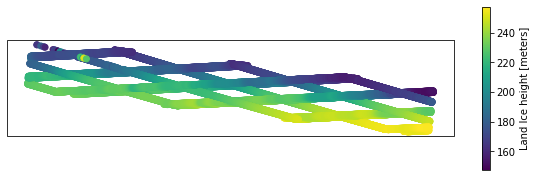

In [37]:
fig = plt.figure(figsize=(10,3)) 
ax = plt.subplot(projection=ccrs.SouthPolarStereo())
atl06ds.plot.scatter(x="latitude", y="longitude", hue="h_li", ax=ax,
                  transform=ccrs.PlateCarree(),
                  subplot_kws={"projection": ccrs.SouthPolarStereo()})

In [39]:
# # Interactive plotting with hvplot
# # https://intake.readthedocs.io/en/latest/plotting.html
# hv_ds = hv.Dataset(atl06ds)
# #hv_ds.to(hv.Scatter, kdims=['segment_id'], vdims=['h_li'])

In [40]:
import hvplot.xarray
# set constant colorbar limits
atl06ds.h_li.sel(rgt=598).dropna('segment_id', how='any').hvplot.scatter(
    'segment_id', 
    size=1,
    marker='o',
    groupby="cycle_number",  # adds a widget for time
    clim=(0, 300),  # sets colormap limits
    widget_type="scrubber",
    widget_location="bottom",
    by='laser', legend='top_right'
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=1, width=550)
        [2] HSpacer()

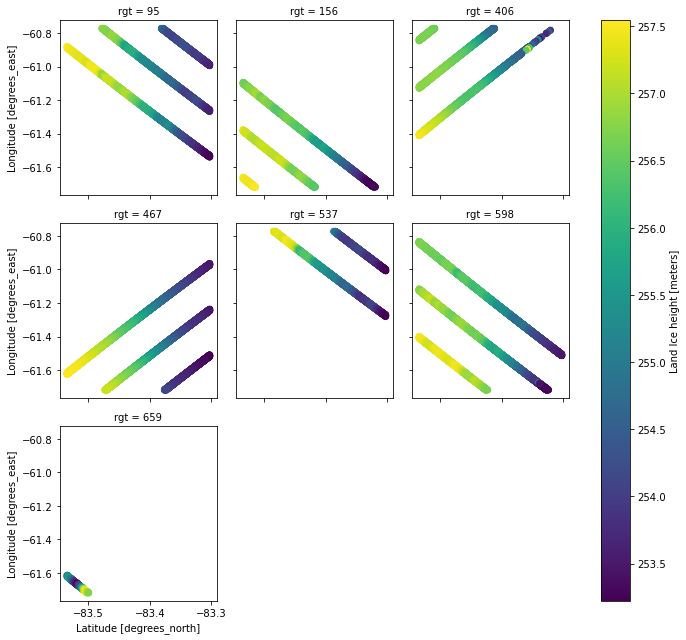

In [41]:
# Plot different rgt
atl06ds.plot.scatter(x="latitude", y="longitude", hue="h_li",col="rgt", size = 3, col_wrap=3)

# 02- Use Intake catalog to read processed ATL06 netcdf and zarr files

#### Why Intake? Read here: https://intake.readthedocs.io/en/latest/overview.html#why-intake

**References:**

- https://intake.readthedocs.io/en/latest/catalog.html
- https://www.anaconda.com/blog/intake-parsing-data-from-filenames-and-paths 
- https://intake.readthedocs.io/en/latest/plugin-directory.html

### Load intake catalog

In [112]:
cat = open_catalog('icesat2catalog.yml')
print (list(cat))

['icesat2atl06hdf5', 'icesat2_zarrcat', 'icesat2_zarrxr']


### Intake GUI panel

Column(width_policy='max')
    [0] Row(width_policy='max')
        [0] PNG(str)
        [1] Column(width_policy='max')
            [0] Column(name='Select Catalog')
                [0] Markdown(str, max_height=40)
                [1] MultiSelect(min_width=200, options={'builtin': <Intake catalo...}, size=9, value=[<Intake catalog: i...], width_policy='min')
            [1] Row(name='Controls')
                [0] Toggle(name='＋', width=50)
                [1] Button(name='―', width=50)
                [2] Toggle(name='🔍', width=50)
        [2] Column(width_policy='max')
            [0] Column(name='Select Data Source')
                [0] Markdown(str, max_height=40)
                [1] MultiSelect(min_width=200, options=OrderedDict([('icesat2atl0...]), size=9, value=[name: icesat2atl06hdf5
co...], width_policy='min')
            [1] Row(name='Controls')
                [0] Toggle(name='📊', width=50)
                [1] Toggle(name='⚙', width=50)
        [3] Column(height=240, name='Description', scroll=True, sizing_mode='stretch_width', width_policy='max')
            [0] Markdown(str)
    [1] Row(width_policy='max')
        [0] Row(height_policy='min', max_width=5000, name='Search', width_policy='max')
        [1] Column(max_width=5000, name='Add Catalog', width_policy='max')
        [2] Column(name='Plot', width_policy='max')
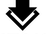

In [114]:
catgui = intake.gui
catgui.add(cat)
catgui

In [116]:
data = catgui.item
data

name: icesat2_zarrxr
container: xarray
plugin: ['zarr']
description: ICESat-2 atl06 in zarr via xarray
direct_access: forbid
user_parameters: []
metadata: 
  plots: 
    elev_scatter: 
      kind: scatter
      x: latitude
      y: longitude
      c: h_li
      width: 500
      height: 500
args: 
  urlpath: /Users/lt/Desktop/Intake_TEST/atl06.zarr
  consolidated: False
  chunks: 
    segment_id: 500
  mask_and_scale: True

In [113]:
# Read zarr file
elev_zarr = cat['icesat2_zarrxr'].to_dask().reset_coords(['delta_time','longitude'])
elev_zarr

/anaconda3/envs/icepyx/lib/python3.7/site-packages/xarray/backends/zarr.py:716: UserWarning: Specified Dask chunks 500 would separate Zarr chunk shape 2974 for dimension 'segment_id'. This significantly degrades performance. Consider rechunking after loading instead.
  chunk_spec = get_chunk(name, var, chunks)


<xarray.Dataset>
Dimensions:                (cycle_number: 2, laser: 6, rgt: 7, segment_id: 2974)
Coordinates:
  * cycle_number           (cycle_number) int64 7 9
  * laser                  (laser) object 'gt1l' 'gt1r' 'gt2l' ... 'gt3l' 'gt3r'
    latitude               (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
  * rgt                    (rgt) int64 95 156 406 467 537 598 659
  * segment_id             (segment_id) float64 1.468e+06 ... 1.541e+06
Data variables:
    atl06_quality_summary  (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    bckgrd                 (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    bsnow_conf             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    bsnow_h                (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    bsnow_od               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    cloud_flg_asr          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    cloud_flg_atm          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    dac                    (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    delta_time             (laser, rgt, cycle_number, segment_id) datetime64[ns] dask.array<chunksize=(3, 4, 1, 500), meta=np.ndarray>
    e_bckgrd               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    h_li                   (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    h_li_sigma             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    layer_flag             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    longitude              (laser, rgt, cycle_number, segment_id) float64 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    msw_flag               (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    neutat_delay_total     (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    r_eff                  (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    sigma_geo_h            (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    solar_azimuth          (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    solar_elevation        (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    tide_earth             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    tide_equilibrium       (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    tide_load              (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    tide_ocean             (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>
    tide_pole              (laser, rgt, cycle_number, segment_id) float32 dask.array<chunksize=(6, 7, 2, 500), meta=np.ndarray>

In [117]:
# Direct plot from intake catalog
icesat2elev = cat['icesat2_zarrxr']
icesat2elev.plot.elev_scatter()

/anaconda3/envs/icepyx/lib/python3.7/site-packages/xarray/backends/zarr.py:716: UserWarning: Specified Dask chunks 500 would separate Zarr chunk shape 2974 for dimension 'segment_id'. This significantly degrades performance. Consider rechunking after loading instead.
  chunk_spec = get_chunk(name, var, chunks)


:Scatter   [latitude]   (longitude,h_li)

In [45]:
import hvplot.xarray
elev_zarr.h_li.sel(rgt=598).dropna('segment_id', how='any').hvplot.scatter(
    'latitude', 
    size=1,
    marker='o',
    groupby="cycle_number", 
    clim=(0, 300),  # sets colormap limits
    widget_type="scrubber",
    widget_location="bottom",
    by='laser', legend='top_right'
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=1, width=550)
        [2] HSpacer()

# 03- Use Intake catalog to read multiple ATL06 hdf5 files

Reference: https://github.com/icesat2py/icepyx/issues/106

In [211]:
cat = open_catalog('icesat2catalog.yml')
print (list(cat))

['atl06_h5', 'atl06_landiceseg_gt', 'icesat2_zarrcat', 'icesat2_zarrxr']


In [212]:
icesat2elev = cat['atl06_landiceseg_gt']
icesat2elev.urlpath

'/Users/lt/Desktop/Intake_TEST/ATL06_RAW/processed_ATL06_*_*_003_*.h5'

#### Q: Not all ICESat-2 files have the specific data group, an error will occur when reading a data file which doesn't have this data group, how to solve this issue? 

In [252]:
laser_list = ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']

icesat2elev = [cat['atl06_landiceseg_gt'](laser = gt).to_dask().assign_coords({"laser": gt}).expand_dims({"laser": [gt]}) for gt in laser_list]
icesat2elev = xr.merge(icesat2elev)
icesat2elev

<xarray.Dataset>
Dimensions:                (delta_time: 24105, laser: 6)
Coordinates:
  * delta_time             (delta_time) datetime64[ns] 2020-04-26T03:46:47.72...
  * laser                  (laser) object 'gt1l' 'gt1r' 'gt2l' ... 'gt3l' 'gt3r'
    latitude               (delta_time) float64 dask.array<chunksize=(2597,), meta=np.ndarray>
    longitude              (delta_time) float64 dask.array<chunksize=(2597,), meta=np.ndarray>
    datetime               (delta_time) datetime64[ns] 2020-04-26T03:45:38 .....
    rgt                    (delta_time) object '0467' '0467' ... '0598' '0598'
    cycle                  (delta_time) object '07' '07' '07' ... '09' '09' '09'
    orbitsegment           <U2 '11'
    version                <U3 '003'
    revision               (delta_time) object '02' '02' '02' ... '01' '01' '01'
Data variables:
    atl06_quality_summary  (laser, delta_time) float64 dask.array<chunksize=(6, 2597), meta=np.ndarray>
    h_li                   (laser, delta_time) float32 dask.array<chunksize=(6, 2597), meta=np.ndarray>
    h_li_sigma             (laser, delta_time) float32 dask.array<chunksize=(6, 2597), meta=np.ndarray>
    segment_id             (laser, delta_time) float64 dask.array<chunksize=(6, 2597), meta=np.ndarray>
    sigma_geo_h            (laser, delta_time) float32 dask.array<chunksize=(6, 2597), meta=np.ndarray>

In [240]:
# icesat2elev = cat['icesat2atl06hdf5'](laser='gt3l', rgt = '0598')
# icesat2elev.plot(x='latitude', y='h_li')

In [ ]:
# hv_ds = hv.Dataset(atlds.h_li)[:, :, :]
# print(hv_ds)
# hv_ds.to(hv.Scatter, kdims=['latitude'], vdims=['h_li'])